## MOwNiT
### Julia Smerdel, ZadanieDomowe11

#### Zad1. Zamiania sygnału na sumę sygnałów.

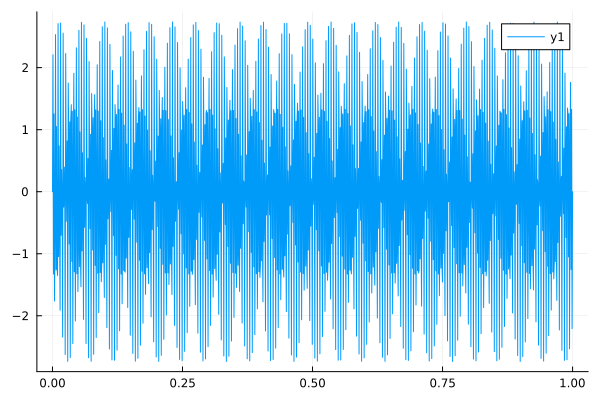

In [77]:
using Plots, FFTW
Fs = 1024
t = 0:1/(Fs-1):1
x = sin.(2*pi*t*200) + 2* sin.(2*pi*t*400)

plot(t, x)

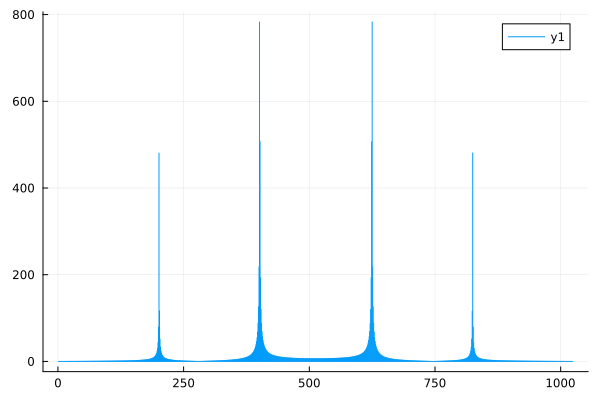

In [78]:
# Fourier transformata
y = fft(x)
sticks((abs.(fft(x))))

#### Zad2. Usuwanie szumów.

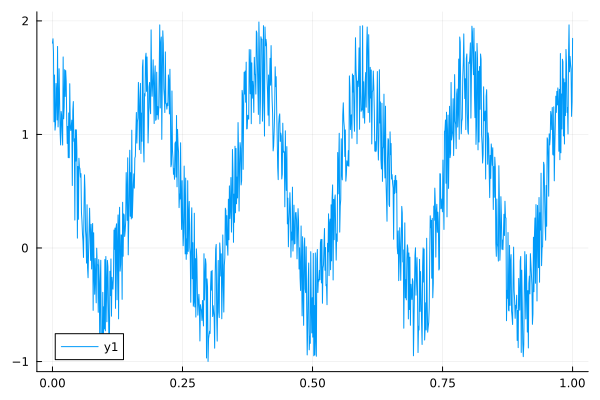

In [84]:
Fs = 1024
t = 0:1/(Fs-1):1
noices = cos.(2*pi*t*5) .+ rand(length(t)) #200Hz
plot(t, noices)


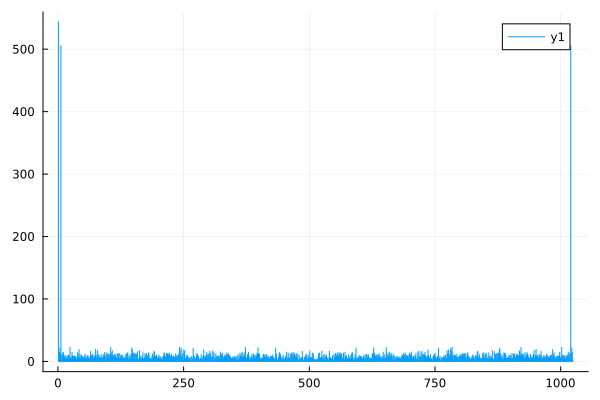

In [85]:
# wykres słupkowy transformaty (moduł z liczb zespolonych).
# symetryczny
# widoczna wysoka amplituda dla częstotliwości sygnału (tutaj 200) oraz symetrycznego odbicia tej 
# częstotliwości  

y = fft(noices)
sticks((abs.(y)))

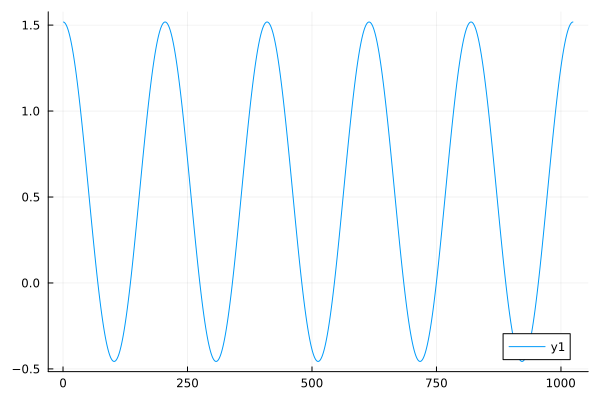

In [86]:
yFiltered = copy(y)

for i in 1:length(yFiltered)
    if abs(yFiltered[i]) < 50
        yFiltered[i] = 0
    end
end

plot(real(ifft(yFiltered)))

     

     


#### Zad3. Własny głos.

In [87]:
using WAV
using PlotlyJS

snd, sampFreq = wavread("mownit.wav")
s1 = snd[:,1]
sampFreq = Int(sampFreq)

timeArray = (0:(size(snd)[1]-1)) / sampFreq
timeArray = timeArray * 1000
plot(timeArray, s1)

In [88]:
fourier = fft(s1)
fourierY = fourier[1:10:length(fourier)]
sticks(abs.(fourierY))

In [89]:
yFiltered = copy(fourier)
for i in 1:length(yFiltered)
    if abs(yFiltered[i]) < 50
        yFiltered[i] = 0
    end
end
plot(real(ifft(yFiltered)))


### Wycięty fragment

In [90]:
cropped = snd[:, 1]
cropped = snd[30000:100000]
wavwrite(cropped, "croppedAudio.wav", Fs=sampFreq)

In [100]:
s1, sampFreq = wavread("croppedAudio.wav")
sampFreq = Int(sampFreq)
s1 .+= (rand(length(s1)) .- 1) / 10 #adding noises
wavplay(s1, sampFreq)

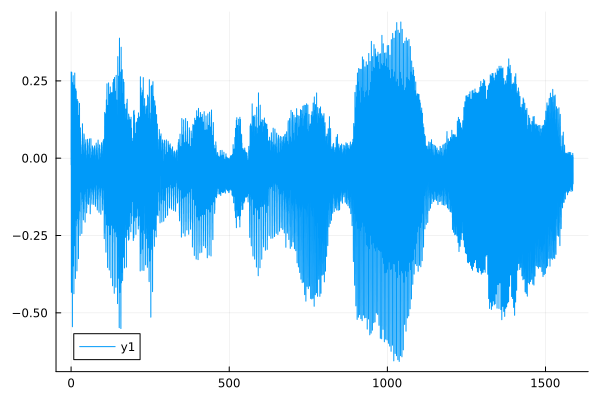

In [101]:
timeArray = (0:(size(s1)[1]-1)) / sampFreq
timeArray = timeArray * 1000
plot(timeArray, s1)

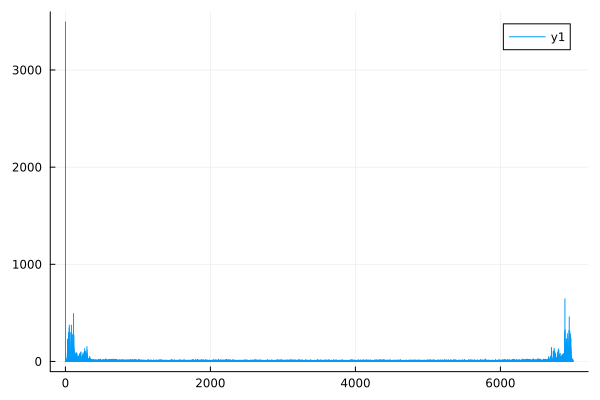

In [102]:
fourier = fft(s1)
fourierY = fourier[1:10:length(fourier)]
sticks(abs.(fourierY))

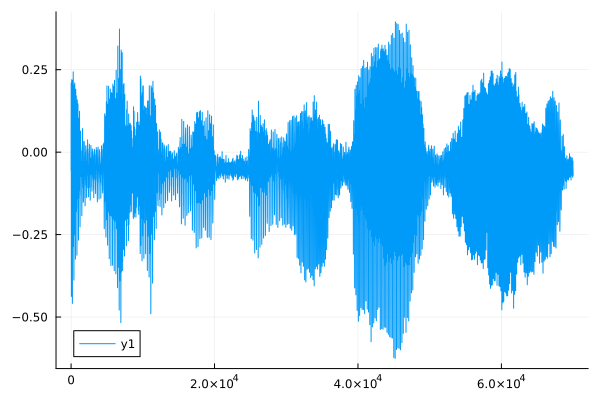

In [126]:
yFiltered = copy(fourier)
for i in 1:length(yFiltered)
    if abs(yFiltered[i]) < 30
        yFiltered[i] = 0
    end
end
plot(real(ifft(yFiltered)))

In [127]:
wavwrite([i.re for i in ifft(yFiltered)], "croppedAudioCleared.wav", Fs=sampFreq)
s1, sampFreq = wavread("croppedAudioCleared.wav")
wavplay(s1, sampFreq)
